## Contents

- [BLDF01](#BLDF01)
- [BDS01](#BDS01)
- [BDU01](#BDU01)
- [Reachable sets of $x_{25}$ plotted over time up to time $1$.](#the_destination)
- [BLDC01](#BLDC01)
- [BDU02](#BDU02)

In [1]:
using Revise, SX, ReachabilityAnalysis, Plots
using BenchmarkTools
LazySets.set_ztol(Float64, 1e-14)

1.0e-14

Open and parse the SX model:

In [2]:
file = "SX/Building_more_decimals.xml"
H = readsxmodel(file, ST=ConstrainedLinearControlContinuousSystem);

The state variables are `x1` to `x48`, then there is the clock and the input `u1`.

In [3]:
vars = collect(keys(H.ext[:variables]))
length(vars), vars[1], vars[48], vars[49], vars[50]

(50, :x1, :x48, :t, :u1)

In [4]:
x25 = [zeros(24); 1.0; zeros(23)];

## BLDF01

For this scenario, the inputs can change arbitrarily over time: $\forall t : u(t) \in \mathcal{U}$.

We build the reachability problem, as an initial value problem with uncertain initial states and inputs:

In [5]:
A = state_matrix(mode(H, 1))
n = size(A, 1) - 1
A = A[1:n, 1:n]
B = input_matrix(mode(H, 1))[1:n, 1]
U = Hyperrectangle(low=[0.8], high=[1.0])
S = @system(x' = Ax + Bu, u ∈ U, x ∈ Universe(n));

initially = " x1 >= 0.0002000 & x1 <= 0.0002500 & x2 >= 0.0002000 & x2 <= 0.0002500 & x3 >= 0.0002000 & x3 <= 0.0002500 & x4 >= 0.0002000 & x4 <= 0.0002500 & x5 >= 0.0002000 & x5 <= 0.0002500 & x6 >= 0.0002000 & x6 <= 0.0002500 & x7 >= 0.0002000 & x7 <= 0.0002500 & x8 >= 0.0002000 & x8 <= 0.0002500 & x9 >= 0.0002000 & x9 <= 0.0002500 & x10 >= 0.0002000 & x10 <= 0.0002500 & x11 >= 0.0000000 & x11 <= 0.0000000 & x12 >= 0.0000000 & x12 <= 0.0000000 & x13 >= 0.0000000 & x13 <= 0.0000000 & x14 >= 0.0000000 & x14 <= 0.0000000 & x15 >= 0.0000000 & x15 <= 0.0000000 & x16 >= 0.0000000 & x16 <= 0.0000000 & x17 >= 0.0000000 & x17 <= 0.0000000 & x18 >= 0.0000000 & x18 <= 0.0000000 & x19 >= 0.0000000 & x19 <= 0.0000000 & x20 >= 0.0000000 & x20 <= 0.0000000 & x21 >= 0.0000000 & x21 <= 0.0000000 & x22 >= 0.0000000 & x22 <= 0.0000000 & x23 >= 0.0000000 & x23 <= 0.0000000 & x24 >= 0.0000000 & x24 <= 0.0000000 & x25 >= -0.0001000 & x25 <= 0.0001000 & x26 >= 0.0000000 & x26 <= 0.0000000 & x27 >= 0.0000000 & x27 <= 0.0000000 & x28 >= 0.0000000 & x28 <= 0.0000000 & x29 >= 0.0000000 & x29 <= 0.0000000 & x30 >= 0.0000000 & x30 <= 0.0000000 & x31 >= 0.0000000 & x31 <= 0.0000000 & x32 >= 0.0000000 & x32 <= 0.0000000 & x33 >= 0.0000000 & x33 <= 0.0000000 & x34 >= 0.0000000 & x34 <= 0.0000000 & x35 >= 0.0000000 & x35 <= 0.0000000 & x36 >= 0.0000000 & x36 <= 0.0000000 & x37 >= 0.0000000 & x37 <= 0.0000000 & x38 >= 0.0000000 & x38 <= 0.0000000 & x39 >= 0.0000000 & x39 <= 0.0000000 & x40 >= 0.0000000 & x40 <= 0.0000000 & x41 >= 0.0000000 & x41 <= 0.0000000 & x42 >= 0.0000000 & x42 <= 0.0000000 & x43 >= 0.0000000 & x43 <= 0.0000000 & x44 >= 0.0000000 & x44 <= 0.0000000 & x45 >= 0.0000000 & x45 <= 0.0000000 & x46 >= 0.0000000 & x46 <= 0.0000000 & x47 >= 0.0000000 & x47 <= 0.0000000 & x48 >= 0.0000000 & x48 <= 0.0000000 & t==0";
f = i -> SX.parse_sxmath(initially)[i].args[3]
X0 = Hyperrectangle(low=[f(i) for i in 1:2:96], high=[f(i) for i in 2:2:96])
prob_BLDF01 = InitialValueProblem(S, X0); # BLDF01

### BLDF01 - BDS01 (dense time)

Bounded time, safe property: for all $t \in [0, 20]$, $y_1(t) = x_{25}(t) \leq 0.0051$. This property is assumed to be satisfied.

In [6]:
@time sol_lgg = solve(prob_BLDF01, T=20.0, alg=LGG09(δ=0.004, template=x25));

  5.337291 seconds (13.88 M allocations: 672.556 MiB, 3.82% gc time)


In [42]:
sol_lgg = nothing
GC.gc()

In [29]:
tiempos = [@elapsed solve(prob_BLDF01, T=20.0, alg=LGG09(δ=0.004, template=x25)) for _ in 1:5];

In [30]:
mean(tiempos)

0.019530091399999998

In [208]:
ρ(x25, sol_lgg)

0.004860238896785219

**Checking BDU01**

In [47]:
ρ(x25, sol_lgg[1])

0.0001

Between $[0, 20]$ there exists at least one $t$ such that the value of $y_1(t)$ crosses $4\times 10^{-3}$.

In [49]:
ρ(x25, sol_lgg)

0.004860238896785219

**Checking BDU02**

In [231]:
@time sol_lgg = solve(prob_BLDF01, T=20.0, alg=LGG09(δ=0.01, template=-x25));

  0.020912 seconds (11.38 k allocations: 7.365 MiB)


In [232]:
-ρ(-x25, sol_lgg)

-0.008301738514187924

In [227]:
-ρ(-x25, sol_lgg[end])

-0.0010355832757975067

### BLDF01 - BDS01 (discrete time)

In [53]:
@time sol_lgg = solve(prob_BLDF01, T=20.0, alg=LGG09(δ=0.01, template=x25, approx_model=NoBloating()));

  0.006678 seconds (6.19 k allocations: 5.896 MiB)


In [51]:
sol_lgg = nothing
GC.gc()

In [40]:
tiempos = [@elapsed solve(prob_BLDF01, T=20.0, alg=LGG09(δ=0.01, template=x25, approx_model=NoBloating())) for _ in 1:5];

In [41]:
mean(tiempos)

0.0059471358

**Checking BDU01**

The UNSAT property `BDU01` also holds.

In [55]:
ρ(x25, sol_lgg)

0.004412266117562403

**Checking BDU02**

In [233]:
@time sol_lgg = solve(prob_BLDF01, T=20.0, alg=LGG09(δ=0.01, template=-x25, approx_model=NoBloating()));
-ρ(-x25, sol_lgg)

  0.004903 seconds (6.20 k allocations: 5.896 MiB)


-0.0064483536827337805

## Plot in [0, 20]

In [308]:
solpos = solve(prob_BLDF01, T=20.0, alg=LGG09(δ=0.004, template=x25));
times = [tspan(X) for X in solpos];

solpos = [ρ(x25, X) for X in solpos]

solneg = solve(prob_BLDF01, T=20.0, alg=LGG09(δ=0.004, template=-x25));
solneg = [ρ(-x25, X) for X in solneg];

polys = [VPolygon([[inf(times[i]), solpos[i]],
                  [inf(times[i]), -solneg[i]],
                  [sup(times[i]), solpos[i]],
                  [sup(times[i]), -solneg[i]]]) for i in 1:length(solpos)];

In [309]:
using LaTeXStrings, Plots, Plots.PlotMeasures, LaTeXStrings

fig = Plots.plot()

plot!(fig, [X for X in polys], color=:blue, alpha=1.0, lw=1.0, linecolor=:blue,
    tickfont=font(30, "Times"), guidefontsize=45,
    xlab=L"t",
    ylab=L"x",
    xtick=[0, 5, 10, 15, 20], ytick=[-0.005, -0.0025, 0.00, 0.0025, 0.005],
    xlims=(0.0, 20.0), ylims=(-0.005, 0.005),
    bottom_margin=6mm, left_margin=5mm, right_margin=12mm, top_margin=3mm,
    size=(1000, 1000))

In [253]:
savefig(fig, "ARCH-COMP20-JuliaReach-Building_BLDF01_t20_v1.pdf")

In [310]:
GC.gc()

## Plot in [0, 1]

In [311]:
solpos = solve(prob_BLDF01, T=1.0, alg=LGG09(δ=0.001, template=x25));
times = [tspan(X) for X in solpos];

solpos = [ρ(x25, X) for X in solpos]

solneg = solve(prob_BLDF01, T=1.0, alg=LGG09(δ=0.001, template=-x25));
solneg = [ρ(-x25, X) for X in solneg];

polys = [VPolygon([[inf(times[i]), solpos[i]],
                  [inf(times[i]), -solneg[i]],
                  [sup(times[i]), solpos[i]],
                  [sup(times[i]), -solneg[i]]]) for i in 1:length(solpos)];

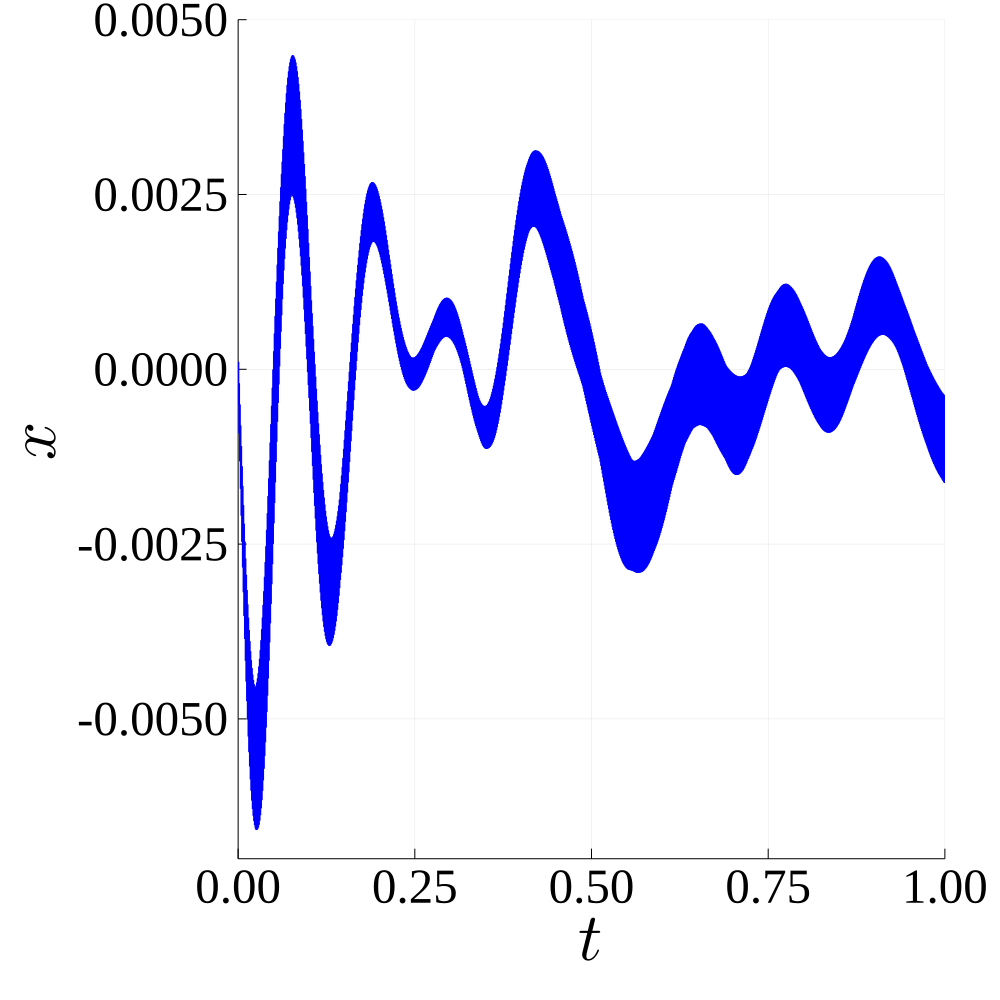

In [312]:
using LaTeXStrings, Plots, Plots.PlotMeasures, LaTeXStrings

fig = Plots.plot()

plot!(fig, [X for X in polys], color=:blue, alpha=1.0, lw=1.0, linecolor=:blue,
    tickfont=font(30, "Times"), guidefontsize=45,
    xlab=L"t",
    ylab=L"x",
    xtick=[0, 0.25, 0.50, 0.75, 1.0], ytick=[-0.005, -0.0025, 0.00, 0.0025, 0.005],
    xlims=(0.0, 1.0), ylims=(-0.007, 0.005),
    bottom_margin=6mm, left_margin=5mm, right_margin=12mm, top_margin=3mm,
    size=(1000, 1000))

In [313]:
savefig(fig, "ARCH-COMP20-JuliaReach-Building_BLDF01_1_v1.pdf")

In [284]:
savefig(fig, "ARCH-COMP20-JuliaReach-Building_BLDF01_1_v1.png")

## BLDC01

For this scenario, inputs are uncertain only in their initial value, and constant over time: $u(0) \in \mathcal{U}$, $u'(t) = 0$.

In [7]:
n = size(H.modes[1].A, 1)-1
A = H.modes[1].A[1:n, 1:n];
x25e = vcat(x25, 0.0);

In [8]:
size(A)

(48, 48)

We add a new variable corresponding to the input with zero dynamics.

In [13]:
Ae = copy(transpose(hcat(transpose(hcat(A, zeros(48))), zeros(49))));

In [14]:
# sanity check
@assert Ae[1:48, 1:48] == A
@assert Ae[49, :] == zeros(49)
@assert Ae[:, 49] == zeros(49);

In [15]:
U = Hyperrectangle(low=[0.8], high=[1.0])
X0 = Hyperrectangle(low=[f(i) for i in 1:2:96], high=[f(i) for i in 2:2:96])
S = LinearContinuousSystem(Ae)

X0 = X0 * U
prob_BLDC01 = InitialValueProblem(S, X0);

In [16]:
@time sol_lgg = solve(prob_BLDC01, T=20.0, alg=LGG09(δ=0.006, template=x25e));

  0.409004 seconds (725.68 k allocations: 47.124 MiB)


In [291]:
sol_lgg = nothing
GC.gc()

In [292]:
tiempos = [@elapsed solve(prob_BLDC01, T=20.0, alg=LGG09(δ=0.006, template=x25e)) for _ in 1:10];

In [293]:
mean(tiempos)

0.0225042228

In [296]:
ρ(x25e, sol_lgg)

0.004751472344743032

**Checking BDU02**

In [184]:
@time sol_lgg = solve(prob_BLDC01, T=20.0, alg=LGG09(δ=0.006, template=-x25e));
-ρ(-x25e, sol_lgg(20.0))

  0.010058 seconds (24.33 k allocations: 11.715 MiB)


-2.2461383575951542e-7

### Plot BLDC01 in [0, 1]

In [319]:
solpos = solve(prob_BLDC01, T=1.0, alg=LGG09(δ=0.001, template=x25e));
times = [tspan(X) for X in solpos];

solpos = [ρ(x25e, X) for X in solpos]

solneg = solve(prob_BLDC01, T=1.0, alg=LGG09(δ=0.001, template=-x25e));
solneg = [ρ(-x25e, X) for X in solneg];

polys = [VPolygon([[inf(times[i]), solpos[i]],
                  [inf(times[i]), -solneg[i]],
                  [sup(times[i]), solpos[i]],
                  [sup(times[i]), -solneg[i]]]) for i in 1:length(solpos)];

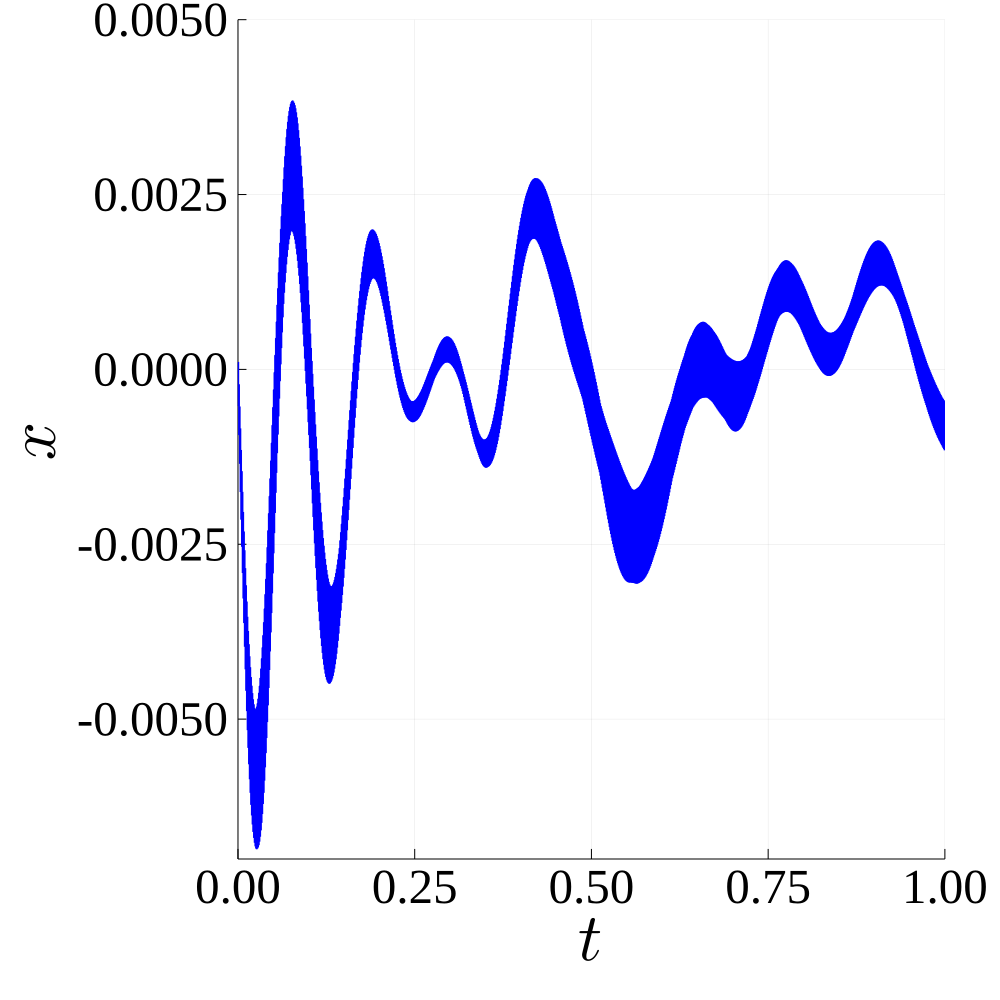

In [320]:
using LaTeXStrings, Plots, Plots.PlotMeasures, LaTeXStrings

fig = Plots.plot()

plot!(fig, [X for X in polys], color=:blue, alpha=1.0, lw=1.0, linecolor=:blue,
    tickfont=font(30, "Times"), guidefontsize=45,
    xlab=L"t",
    ylab=L"x",
    xtick=[0, 0.25, 0.50, 0.75, 1.0], ytick=[-0.005, -0.0025, 0.00, 0.0025, 0.005],
    xlims=(0.0, 1.0), ylims=(-0.007, 0.005),
    bottom_margin=6mm, left_margin=5mm, right_margin=12mm, top_margin=3mm,
    size=(1000, 1000))

In [321]:
savefig(fig, "ARCH-COMP20-JuliaReach-Building_BLDC01_t1_v1.pdf")

### Plot BLDC01 in [0, 20]

In [18]:
solpos = solve(prob_BLDC01, T=20.0, alg=LGG09(δ=0.001, template=x25e));
times = [tspan(X) for X in solpos];

solpos = [ρ(x25e, X) for X in solpos]

solneg = solve(prob_BLDC01, T=20.0, alg=LGG09(δ=0.001, template=-x25e));
solneg = [ρ(-x25e, X) for X in solneg];

polys = [VPolygon([[inf(times[i]), solpos[i]],
                  [inf(times[i]), -solneg[i]],
                  [sup(times[i]), solpos[i]],
                  [sup(times[i]), -solneg[i]]]) for i in 1:length(solpos)];

In [19]:
GC.gc()

In [30]:
using LaTeXStrings, Plots, Plots.PlotMeasures, LaTeXStrings

fig = Plots.plot()

plot!(fig, [X for X in polys[1:3:length(polys)]], color=:blue, alpha=1.0, lw=1.0, linecolor=:blue,
    tickfont=font(30, "Times"), guidefontsize=45,
    xlab=L"t",
    ylab=L"x",
    xtick=[0, 5, 10, 15, 20], ytick=[-0.005, -0.0025, 0.00, 0.0025, 0.005],
    xlims=(0.0, 20.0), ylims=(-0.005, 0.005),
    bottom_margin=6mm, left_margin=5mm, right_margin=12mm, top_margin=3mm,
    size=(1000, 1000))

In [31]:
savefig(fig, "ARCH-COMP20-JuliaReach-Building_BLDC01_t20_v1.pdf")

### BLDC01 - discrete

In [149]:
@time sol_lgg = solve(prob_BLDC01, T=20.0, alg=LGG09(δ=0.01, template=x25e, approx_model=NoBloating()));

  0.002373 seconds (8.12 k allocations: 1.921 MiB)


In [145]:
sol_lgg = nothing
GC.gc()

In [146]:
tiempos = [@elapsed solve(prob_BLDC01, T=20.0, alg=LGG09(δ=0.01, template=x25e, approx_model=NoBloating())) for _ in 1:10];

In [147]:
mean(tiempos)

0.0035100409999999998

In [150]:
ρ(x25e, sol_lgg)

0.003770740032965415

### Plot

In [261]:
solpos = solve(prob_BLDC01, T=20.0, alg=LGG09(δ=0.006, template=x25e));
times = [tspan(X) for X in solpos];

solpos = [ρ(x25e, X) for X in solpos]

solneg = solve(prob_BLDC01, T=20.0, alg=LGG09(δ=0.006, template=-x25e));
solneg = [ρ(-x25e, X) for X in solneg];

polys = [VPolygon([[inf(times[i]), solpos[i]],
                  [inf(times[i]), -solneg[i]],
                  [sup(times[i]), solpos[i]],
                  [sup(times[i]), -solneg[i]]]) for i in 1:length(solpos)];

In [270]:
#@time solz = solve(prob_BLDC01, T=20.0, alg=GLGM06(δ=0.006, max_order=1));
@time solb = solve(prob_BLDC01, T=20.0, alg=BOX(δ=0.006));

  0.064412 seconds (21.67 k allocations: 71.159 MiB)


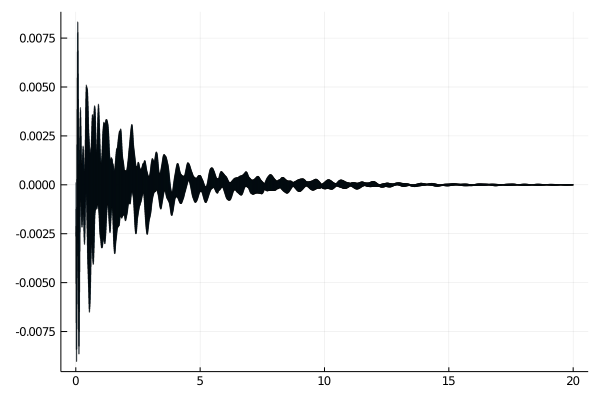

In [271]:
plot(solb, vars=(0, 25))

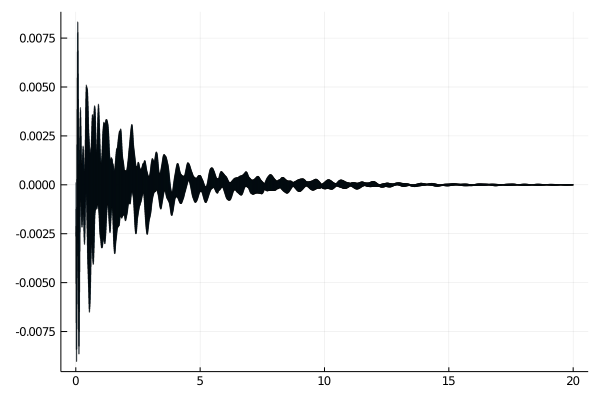

In [265]:
plot(solz, vars=(0, 25))

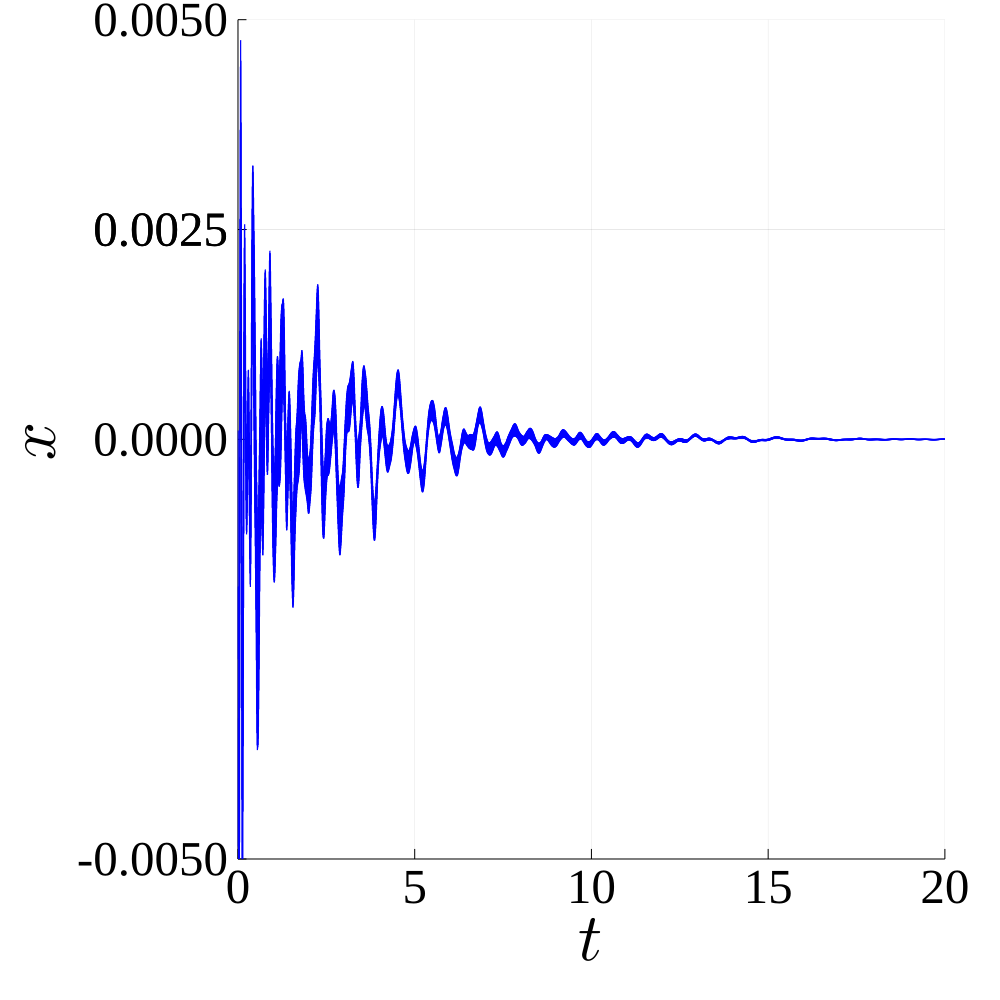

In [262]:
using LaTeXStrings, Plots, Plots.PlotMeasures, LaTeXStrings

fig = Plots.plot()

plot!(fig, [X for X in polys], color=:blue, alpha=1.0, lw=1.0, linecolor=:blue,
    tickfont=font(30, "Times"), guidefontsize=45,
    xlab=L"t",
    ylab=L"x",
    xtick=[0, 5, 10, 15, 20], ytick=[-0.005, 0.0025, 0.00, 0.0025, 0.005],
    xlims=(0.0, 20.0), ylims=(-0.005, 0.005),
    bottom_margin=6mm, left_margin=5mm, right_margin=12mm, top_margin=3mm,
    size=(1000, 1000))

In [ ]:
savefig(fig, "ARCH-COMP20-JuliaReach-Building_BLDC01_v1.pdf")